# Membangun model clustering gempa bumi yang terjadi di Indonesia pada tahun 2021

pertama kita perlu mengunggah data gempa bumi yang akan diklasterisasi 

In [184]:
import pandas as pd
import numpy as np

In [185]:
data = pd.read_csv('data_clean.csv')

In [186]:
data.head(10)

,Lat,Lon,Dep,M,Region
0,-7.74,122.70,314,3.8,Flores Sea
1,-1.36,120.46,10,3.1,Sulawesi
2,-5.72,102.95,10,3.4,Southern Sumatra
3,1.71,127.42,105,3.2,Halmahera
4,-0.99,120.27,10,2.6,Minahassa Peninsula Sulawesi
5,0.21,96.63,16,3.7,Off West Coast of Northern Sumatra
6,-7.81,118.68,10,2.7,Flores Sea
7,-7.56,104.81,10,4.2,Southwest of Sumatra
8,0.87,126.53,13,2.6,Northern Molucca Sea
9,3.49,96.54,10,2.9,Northern Sumatra


selanjutnya kita akan mencoba untuk melakukan plotting pada data menggunakan library Folium.

In [187]:
import folium

# create a new map object
m = folium.Map(location=(-00.7893000, 116.9213000), zoom_start=5)

In [188]:
for i in range(len(data)):
    folium.Circle(
        location=[data.iloc[i]['Lat'], data.iloc[i]['Lon']],
        radius=10,
    ).add_to(m)

In [189]:
m

data gempa bumi yang terjadi di Indonesia pada tahun 2021 berhasil diplot pada peta. gempa bumi yang terjadi di Indonesia banyak terjadi pada pulau Sumatera, Jawa, Nusa Tenggara, Sulawesi, Maluku, dan Papua.

jika diperhatikan ada banyak sekali titik gempa yang terjadi di indonesia pada tahun 2021, namun perlu diketahui data yang ditampilkan merupakan data gempa bumi yang tercatat oleh BMKG namun belum melalui proses eliminasi berdasarkan magnitudonya. artinya ada banyak data gempa bumi yang mungkin saja merupakan gempa bumi dengan intensitas kecil namun tetap tercatat pada data.

menurut USSG[1] gempa bumi dapat yang dapat dirasakan oleh manusia berkisar pada magnitudo lebih dari 4 skala richter. 

maka kita akan melakukan eliminasi pada data gempa bumi yang memiliki magnitudo kurang dari 4 dalam skala richter.

In [190]:
df = data.drop(data[data['M'] < 4].index)
df.reset_index(drop=True)

,Lat,Lon,Dep,M,Region
0,-7.56,104.81,10,4.2,Southwest of Sumatra
1,-2.26,102.31,211,4.6,Southern Sumatra
2,2.67,128.41,16,4.3,Halmahera
3,-7.54,128.17,185,4.7,Banda Sea
4,-9.17,110.71,10,4.0,South of Java
...,...,...,...,...,...
1842,-4.48,126.11,398,4.3,Banda Sea
1843,-7.58,128.67,197,4.2,Banda Sea
1844,-0.22,124.45,10,4.7,Southern Molucca Sea
1845,-1.85,120.53,10,4.0,Sulawesi


In [191]:
n = folium.Map(location=(-00.7893000, 116.9213000), zoom_start=5)

for i in range(len(df)):
    folium.Circle(
        location=[df.iloc[i]['Lat'], df.iloc[i]['Lon']],
        radius=10,
    ).add_to(n)

n

plot diatas menampilkan data gempa bumi yang terjadi di indonesia dengan magnitudo diatas 4 skala richter.
data tersebut terdiri dari 1847 baris data dari yang sebelumnya berjumlah 8115 baris sebelum dilakukan eliminasi.

selanjutnya kita akan menggunakan data yang telah dieliminasi sebagai data yang akan dicluster agar model yang dihasilkan dapat lebih representatif terhadap data gempa bumi di indonesia.

adapun clustering yang akan dilakukan terbagi menjadi 2 bagian yaitu clustering pada koordinat lokasi terjadinya gempa bumi dan clustering data magnitudo serta kedalaman gempa bumi yang terjadi.

# CLUSTERING DATA GEMPA BUMI BERDASARKAN TITIK LOKASI TERJADINYA GEMPA

kita akan mengambil data longitude dan latitude serta melakukan klasterisasi berdasarkan data tersebut.

adapun teknik klasterisasi yang akan digunakan yaitu:
- KNN
- Hierarchical (Aglomerative)
- DBScan

In [192]:
data_cluster = df.iloc[:, [1, 0]].values

kita mengambil data longitude serta latitude yang akan digunakan dalam klasterisasi

## KNN

kita akan mencari nilai n (neighbour) yang akan digunakan pada KNN menggunakan teknik elbow/knee

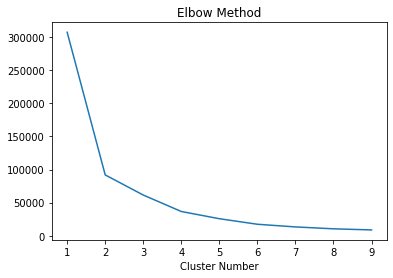

In [194]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 0)
    kmeans.fit(data_cluster)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 10), wcss)
plt.title('Elbow Method')
plt.xlabel('Cluster Number')
plt.show()

berdasarkan perhitungan menggunakan metode elbow maka kita akan membangun model klastering KNN dengan nilai n=2

In [195]:
kmeans = KMeans(n_clusters = 2, init = 'k-means++', random_state = 0)
y_kmeans = kmeans.fit_predict(data_cluster)

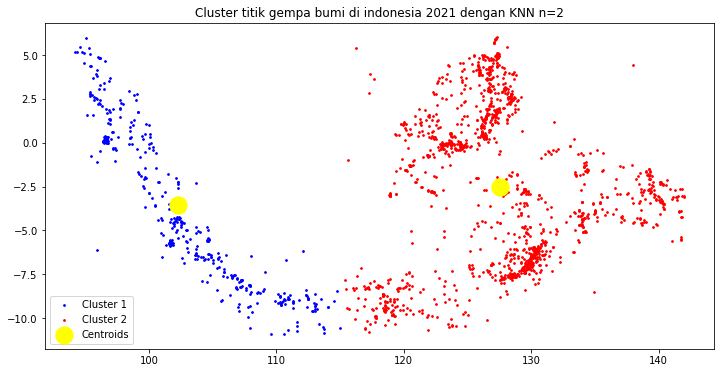

In [202]:
plt.figure(figsize=(12,6))
plt.scatter(data_cluster[y_kmeans == 0, 0], data_cluster[y_kmeans == 0, 1], s = 3, c = 'blue', label = 'Cluster 1')
plt.scatter(data_cluster[y_kmeans == 1, 0], data_cluster[y_kmeans == 1, 1], s = 3, c = 'red', label = 'Cluster 2')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 300, c = 'yellow', label = 'Centroids')
plt.title('Cluster titik gempa bumi di indonesia 2021 dengan KNN n=2')
plt.legend()

gambar diatas merupakan klasterisasi yang berhasil dibuat dengan menggunakan algoritma KNN dan n=2

<h2> HIERARCHICAL CLUSTERING </h2>

pada metode hierarchical clustering kita dapat menentukan nilai N pada klaster menggunakan metode dendogram

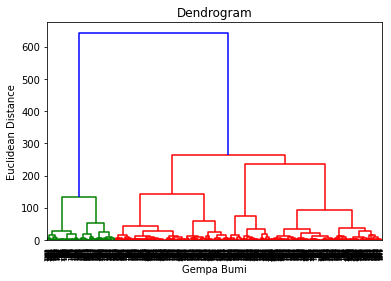

In [199]:
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(data_cluster, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Gempa Bumi')
plt.ylabel('Euclidean Distance')
plt.show()

berdasarkan dendogram yang terbentuk maka kita akan mengambil nilai n=2

In [200]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(data_cluster)

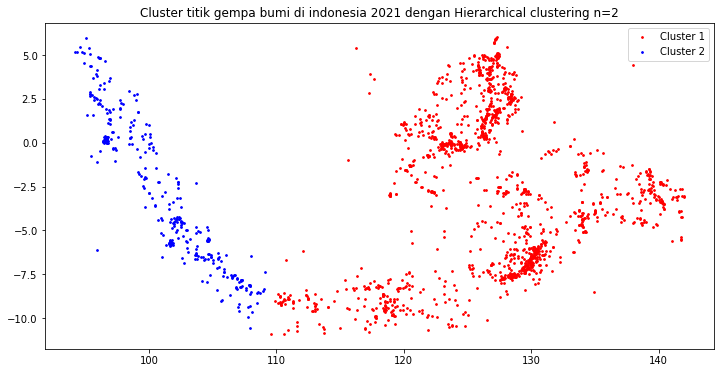

In [204]:
plt.figure(figsize=(12,6))
plt.scatter(data_cluster[y_hc == 0, 0], data_cluster[y_hc == 0, 1], s = 3, c = 'red', label = 'Cluster 1')
plt.scatter(data_cluster[y_hc == 1, 0], data_cluster[y_hc == 1, 1], s = 3, c = 'blue', label = 'Cluster 2')

plt.title('Cluster titik gempa bumi di indonesia 2021 dengan Hierarchical clustering n=2')
plt.legend()
plt.show()

gambar diatas merupakan klasterisasi yang berhasil dibuat dengan menggunakan algoritma hierarchical (agglomerative)
terlihat klaster yang terbentuk pada data dengan teknik hierarchical berbeda dengan klaster yang dibentuk oleh KNN walaupun dengan jumlah klaster yang sama.

<h2> DBScan </h2>

selanjutnya kita akan mencoba menggunakan algoritma DBScan untuk melakukan klasterisasi pada data lokasi gempa bumi.
algoritma DBScan menggunakan parameter *eps* dan *min_sample* yang dapat disetting untuk mendapatkan klasterisasi yang lebih baik.

In [205]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

X = data_cluster

In [206]:
db = DBSCAN(eps=2.5, min_samples=55).fit(X)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

In [207]:
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels))

Estimated number of clusters: 4
Estimated number of noise points: 17
Silhouette Coefficient: 0.423


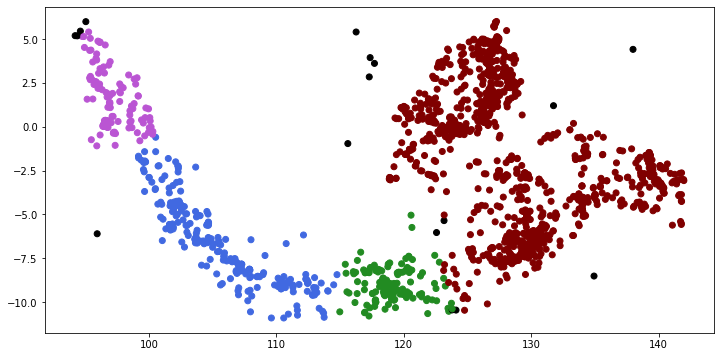

In [208]:
clusters = labels

colors = ['royalblue', 'maroon', 'forestgreen', 'mediumorchid', 'tan', 'deeppink', 'olive', 'goldenrod', 'lightcyan', 'navy', 'black']
vectorizer = np.vectorize(lambda x: colors[x % len(colors)])

plt.figure(figsize=(12,6))
plt.scatter(X[:,0], X[:,1], c=vectorizer(clusters))

gambar diatas merupakan klasterisasi yang berhasil dibuat dengan menggunakan algoritma DBScan dengan nilai eps=2.5 dan min_sample=55
klasterisasi dengan DBScan dan parameter tersebut menghasilkan 4 klaster. adapun titik hitam pada beberapa sudut klaster merupakan titik yang dianggap sebagai noise sehingga tidak termasuk kedalam klaster

# CLUSTERING DATA GEMPA BUMI BERDASARKAN KEDALAMAN DAN MAGNITUDO

pada klastering berdasarkan kedalaman dan magnitudo kita akan menggunakan tiga teknik yang sama seperti klastering pada titik lokasi gempa, hanya saja kita tidak akan menggunakan data longitude dan latitude sebagai data yang akan diklaster melainkan kita akan menggunakan data kedalaman (Depth) serta magnitudo (M)

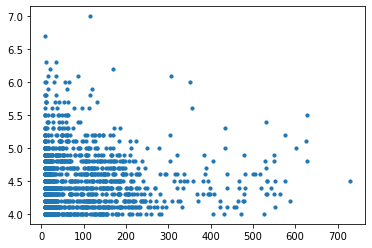

In [209]:
plt.scatter(df['Dep'], df['M'],s = 10)
plt.show()

In [ ]:
data_cluster_mag = df.iloc[:, [2, 3]].values

kita mengambil data longitude serta latitude yang akan digunakan dalam klasterisasi

<h2> KNN

kita akan mencari nilai n (neighbour) yang akan digunakan pada KNN menggunakan teknik elbow/knee

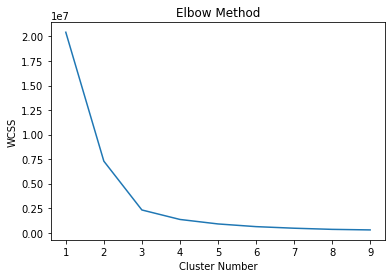

In [210]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 0)
    kmeans.fit(data_cluster_mag)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 10), wcss)
plt.title('Elbow Method')
plt.xlabel('Cluster Number')
plt.ylabel('WCSS')
plt.show()

berdasarkan perhitungan menggunakan metode elbow maka kita akan membangun model klastering KNN dengan nilai n=3

In [217]:
kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 0)
y_kmeans = kmeans.fit_predict(data_cluster_mag)

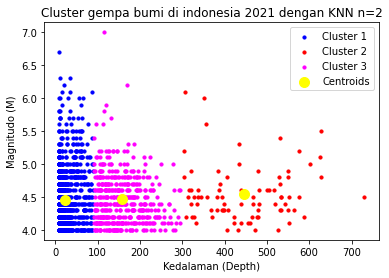

In [218]:
plt.scatter(data_cluster_mag[y_kmeans == 0, 0], data_cluster_mag[y_kmeans == 0, 1], s = 10, c = 'blue', label = 'Cluster 1')
plt.scatter(data_cluster_mag[y_kmeans == 1, 0], data_cluster_mag[y_kmeans == 1, 1], s = 10, c = 'red', label = 'Cluster 2')
plt.scatter(data_cluster_mag[y_kmeans == 2, 0], data_cluster_mag[y_kmeans == 2, 1], s = 10, c = 'magenta', label = 'Cluster 3')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 100, c = 'yellow', label = 'Centroids')
plt.title('Cluster gempa bumi di indonesia 2021 dengan KNN n=2')
plt.xlabel('Kedalaman (Depth)')
plt.ylabel('Magnitudo (M)')
plt.legend()

gambar diatas merupakan klasterisasi yang berhasil dibuat dengan menggunakan algoritma KNN dan n=3

<h2> Hierarchical clustering

pada metode hierarchical clustering kita dapat menentukan nilai N pada klaster menggunakan metode dendogram

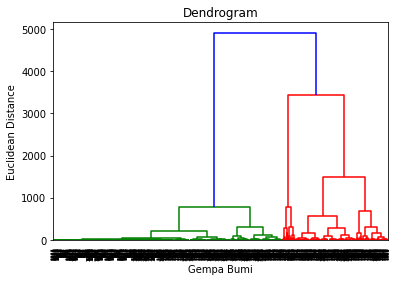

In [213]:
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(data_cluster_mag, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Gempa Bumi')
plt.ylabel('Euclidean Distance')
plt.show()

berdasarkan dendogram yang terbentuk maka kita akan mengambil nilai n=3

In [219]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(data_cluster_mag)

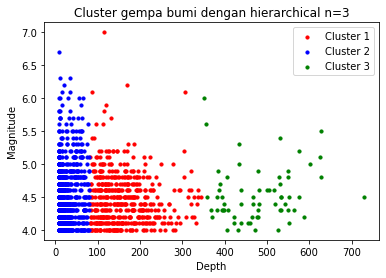

In [221]:
plt.scatter(data_cluster_mag[y_hc == 0, 0], data_cluster_mag[y_hc == 0, 1], s = 10, c = 'red', label = 'Cluster 1')
plt.scatter(data_cluster_mag[y_hc == 1, 0], data_cluster_mag[y_hc == 1, 1], s = 10, c = 'blue', label = 'Cluster 2')
plt.scatter(data_cluster_mag[y_hc == 2, 0], data_cluster_mag[y_hc == 2, 1], s = 10, c = 'green', label = 'Cluster 3')
plt.title('Cluster gempa bumi dengan hierarchical n=3')
plt.xlabel('Depth')
plt.ylabel('Magnitude')
plt.legend()
plt.show()

gambar diatas merupakan klasterisasi yang berhasil dibuat dengan menggunakan hierarchical (agglomerative)
klaster yang terbentuk oleh algoritma hierarchical dan KNN hampir sama namun memiliki perbedaan pada besar klaster yang dihasilkan

<h2> DBScan

selanjutnya kita akan mencoba menggunakan algoritma DBScan untuk melakukan klasterisasi pada data lokasi gempa bumi.
algoritma DBScan menggunakan parameter *eps* dan *min_sample* yang dapat disetting untuk mendapatkan klasterisasi yang lebih baik.

In [222]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

Xs = data_cluster_mag

In [228]:
db = DBSCAN(eps=1.5, min_samples=100).fit(Xs)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

In [229]:
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(Xs, labels))

Estimated number of clusters: 1
Estimated number of noise points: 1157
Silhouette Coefficient: 0.228


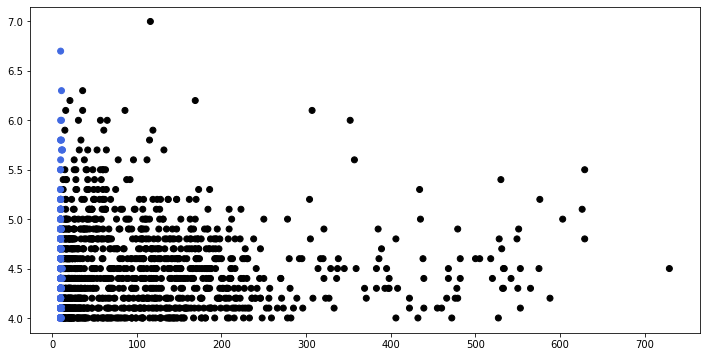

In [230]:
clusters_2 = labels

colors = ['royalblue', 'maroon', 'forestgreen', 'mediumorchid', 'tan', 'deeppink', 'olive', 'goldenrod', 'lightcyan', 'navy', 'black']
vectorizer = np.vectorize(lambda x: colors[x % len(colors)])

plt.figure(figsize=(12,6))
plt.scatter(Xs[:,0], Xs[:,1], c=vectorizer(clusters_2))

klasterisasi data dengan menngunakn algoritma DBScan terlihat kurang berhasil membentuk klaster pada data kedalaman serta magnitudo dari gempa bumi.
hal ini dapat diakibatkan oleh beberapa hal namun dugaan awal adalah karena bentuk dari data yang digunakan kurang cocok dengan algortima DBScan.